# **Importing necessary Libraries**

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from wordcloud import WordCloud
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [9]:
pip install wordcloud

# **Basic Exploration for Dataset**

In [10]:
data = pd.read_csv("/content/Prepared Song Popularity.csv")

In [11]:
data.head()

,Unnamed: 0,Song,Album,Artist Names,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,...,Hot100 Ranking Year,Decade,Season,number of song image details,Artist(s) Genres,Genres count,Weight,total weight of genres,Album_isTop_1810,Generes Clusters
0,0,I Need You,I Need You,['LeAnn Rimes'],44,229826,https://open.spotify.com/track/046MBhhgQJJghnb...,https://i.scdn.co/image/ab67616d00001e025cf523...,spotify:track:046MBhhgQJJghnbgZCkaAR,62,...,2001,new millennium,Winter,14,"{' country', 'country dawn', ' contemporary co...",4,478,1912,False,0
1,1,Sweet Lady,Tyrese,['Tyrese'],43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQ...,https://i.scdn.co/image/ab67616d00001e0283422e...,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,63,...,1999,Nighnties,Summer,10,"{' contemporary r&b', ' urban contemporary', '...",4,1718,6872,False,7
2,2,You Take My Breath Away - Mono Version,Sooner or Later,['Rex Smith'],86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6...,https://i.scdn.co/image/ab67616d00001e02d1741c...,spotify:track:3BCMsz55asr7Yr6DqB9N8D,49,...,1979,Seventies,Spring,14,{'bubblegum pop'},1,47,47,False,11
3,3,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),"['Doris Day', 'The Mellomen']",20,169066,https://open.spotify.com/track/20G1XJaTwIm2Iuw...,https://i.scdn.co/image/ab67616d00001e02f2ee02...,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,43,...,1954,Fourties,Winter,7,"{' movie tunes', ' easy listening', ' vocal ja...",5,493,2465,False,10
4,4,Don't Forget About Us (As Made Famous By Maria...,Drew's Famous # 1 Karaoke Hits: Sing the Hits ...,['The Karaoke Crew'],50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv...,https://i.scdn.co/image/ab67616d00001e02b0d3e3...,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,...,2011,new millennium,Summer,16,{'karaoke'},1,177,177,False,9


In [12]:
for column_name in data.columns:
    print(column_name)

Unnamed: 0
Song
Album
Artist Names
Hot100 Rank
Song Length(ms)
Spotify Link
Song Image
Spotify URI
Popularity
Acousticness
Danceability
Energy
Instrumentalness
Liveness
Loudness
Speechiness
Tempo
Valence
Key
Mode
Time Signature
number of words of the song name
number of characters of the song name
is_local
num_of_song_avaliable_markets
Duration Category
has_Potential
is_colorful
color_values
image_description
fromTop1000Artist
isItCatchy
Album Release Date
Hot100 Ranking Year
Decade
Season
number of song image details
Artist(s) Genres
Genres count
Weight
total weight of genres
Album_isTop_1810
Generes Clusters


In [13]:
data.shape

(6191, 44)

In [14]:
data.drop(columns=['Unnamed: 0'],inplace=True)

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6191 entries, 0 to 6190
Data columns (total 43 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Song                                   6191 non-null   object 
 1   Album                                  6191 non-null   object 
 2   Artist Names                           6191 non-null   object 
 3   Hot100 Rank                            6191 non-null   int64  
 4   Song Length(ms)                        6191 non-null   int64  
 5   Spotify Link                           6191 non-null   object 
 6   Song Image                             6191 non-null   object 
 7   Spotify URI                            6191 non-null   object 
 8   Popularity                             6191 non-null   int64  
 9   Acousticness                           6191 non-null   float64
 10  Danceability                           6191 non-null   float64
 11  Ener

In [16]:
data.describe()

,Hot100 Rank,Song Length(ms),Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,...,number of words of the song name,number of characters of the song name,num_of_song_avaliable_markets,isItCatchy,Hot100 Ranking Year,number of song image details,Genres count,Weight,total weight of genres,Generes Clusters
count,6191.000000,6.191000e+03,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,...,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6.191000e+03,6191.000000
mean,48.320627,2.246265e+05,54.117913,0.300063,0.617710,0.596881,0.045992,0.180755,-8.718824,0.072038,...,4.193668,21.574221,156.318850,0.874657,1995.975933,11.724600,4.765304,1291.610079,1.694101e+04,9.657083
std,29.185349,6.436037e+04,21.511330,0.291133,0.156799,0.205486,0.170713,0.150009,3.774887,0.079253,...,2.927691,16.144939,61.723358,0.331134,18.255277,2.594248,6.399237,1820.832670,9.501383e+04,5.812568
min,1.000000,5.180000e+04,0.000000,0.000004,0.000000,0.012000,0.000000,0.015000,-37.841000,0.000000,...,1.000000,1.000000,0.000000,0.000000,1946.000000,3.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,23.000000,1.817595e+05,42.000000,0.049250,0.520500,0.455500,0.000000,0.087200,-11.122500,0.032300,...,2.000000,11.000000,180.000000,1.000000,1982.000000,11.000000,2.000000,177.000000,3.420000e+02,5.000000
50%,47.000000,2.207340e+05,58.000000,0.195000,0.633000,0.615000,0.000004,0.123000,-8.128000,0.041600,...,3.000000,17.000000,184.000000,1.000000,1999.000000,12.000000,4.000000,784.000000,3.064000e+03,9.000000
75%,74.000000,2.571130e+05,70.000000,0.511500,0.728000,0.758000,0.000523,0.232000,-5.787500,0.068800,...,5.000000,27.000000,185.000000,1.000000,2011.000000,13.000000,6.000000,1743.000000,9.436000e+03,16.000000
max,100.000000,1.561133e+06,94.000000,0.995000,0.988000,0.997000,0.972000,0.985000,-0.810000,0.911000,...,36.000000,163.000000,185.000000,1.000000,2023.000000,19.000000,84.000000,17887.000000,1.502508e+06,19.000000


In [17]:
data.isnull().sum()/len(data)*100

Song                                     0.000000
Album                                    0.000000
Artist Names                             0.000000
Hot100 Rank                              0.000000
Song Length(ms)                          0.000000
Spotify Link                             0.000000
Song Image                               0.000000
Spotify URI                              0.000000
Popularity                               0.000000
Acousticness                             0.000000
Danceability                             0.000000
Energy                                   0.000000
Instrumentalness                         0.000000
Liveness                                 0.000000
Loudness                                 0.000000
Speechiness                              0.000000
Tempo                                    0.000000
Valence                                  0.000000
Key                                      0.000000
Mode                                     0.000000


In [18]:
data['Artist(s) Genres'].fillna('[]', inplace=True)

In [19]:
data.isnull().sum()/len(data)*100

Song                                     0.0
Album                                    0.0
Artist Names                             0.0
Hot100 Rank                              0.0
Song Length(ms)                          0.0
Spotify Link                             0.0
Song Image                               0.0
Spotify URI                              0.0
Popularity                               0.0
Acousticness                             0.0
Danceability                             0.0
Energy                                   0.0
Instrumentalness                         0.0
Liveness                                 0.0
Loudness                                 0.0
Speechiness                              0.0
Tempo                                    0.0
Valence                                  0.0
Key                                      0.0
Mode                                     0.0
Time Signature                           0.0
number of words of the song name         0.0
number of 

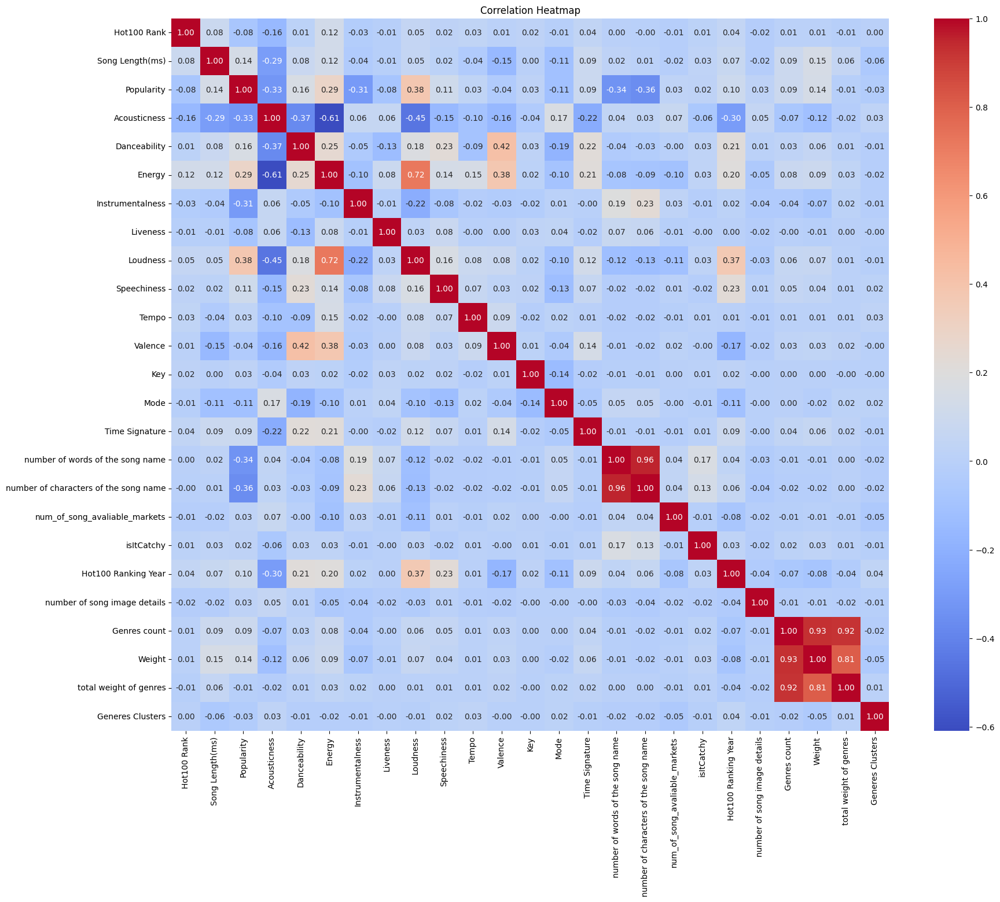

In [41]:
# Select only numeric columns
numeric_columns = data.select_dtypes(include='number')
correlation_matrix = numeric_columns.corr()
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# **Profile Report**

In [ ]:
!pip install pandas-profiling


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 27.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=465b1391981962892c83dbf030c449024d494140763f26783f7e98507bf47027
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
!pip install markupsafe==2.0.1

In [ ]:
from pandas_profiling import ProfileReport

# Assuming 'data' is your DataFrame
profile = ProfileReport(data, config_file="")

# Now you can generate the profile report
profile.to_file("data_profile_report.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: xlabel='Duration Category', ylabel='count'>

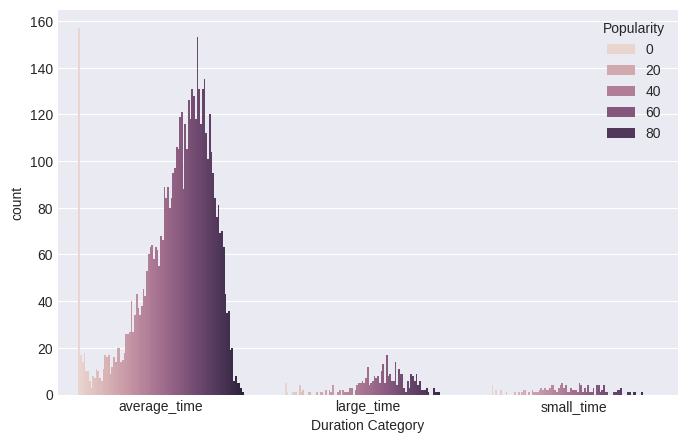

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(x="Duration Category",hue='Popularity' ,data=data)

<Axes: xlabel='is_colorful', ylabel='count'>

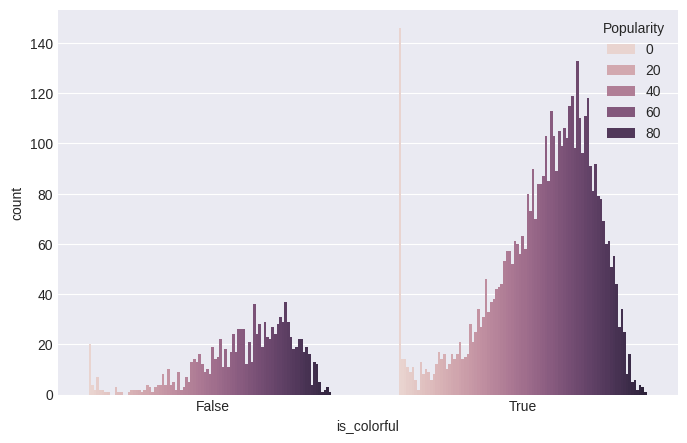

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(x="is_colorful",hue='Popularity' ,data=data)

<Axes: xlabel='isItCatchy', ylabel='count'>

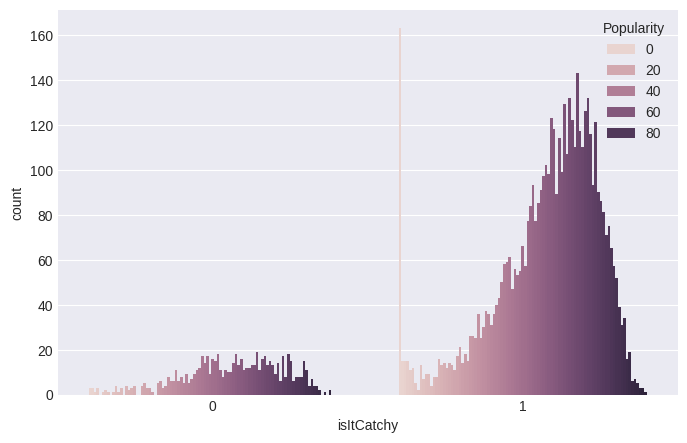

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(x="isItCatchy",hue='Popularity' ,data=data)

<Axes: xlabel='Season', ylabel='count'>

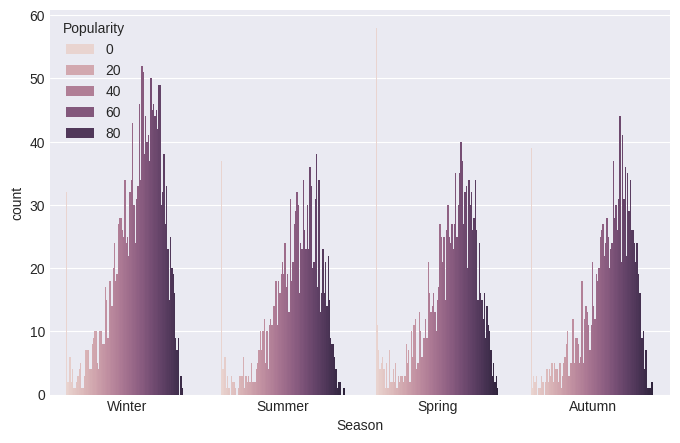

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(x="Season",hue='Popularity' ,data=data)

## Top Genre

<ipython-input-128-2de68f33884d>:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




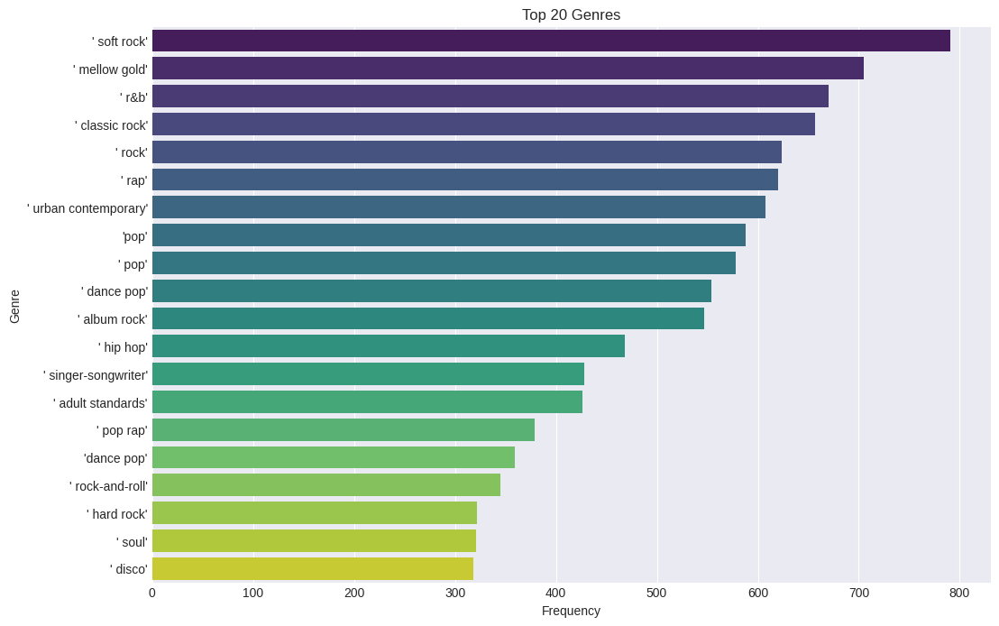

In [ ]:
#frequency of each genre
genre_counts = {}
for genres_set in data['Artist(s) Genres']:
    genres_list = [genre.strip().lower() for genre in genres_set[1:-1].split(',')]
    # Removing duplicates within each set
    genres_list = list(set(genres_list))
    for genre in genres_list:
        if genre in genre_counts:
            genre_counts[genre] += 1
        else:
            genre_counts[genre] = 1

# Sorting genres based on their frequency
sorted_genre_counts = dict(sorted(genre_counts.items(), key=lambda item: item[1], reverse=True))

# Visualizing the top 20 genres
top_genres = list(sorted_genre_counts.keys())[:20]
genre_counts_top = {genre: sorted_genre_counts[genre] for genre in top_genres}

plt.figure(figsize=(12, 8))
sns.barplot(x=list(genre_counts_top.values()), y=list(genre_counts_top.keys()), palette="viridis")
plt.xlabel('Frequency')
plt.ylabel('Genre')
plt.title('Top 20 Genres')
plt.show()


<ipython-input-129-e28602d47f17>:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




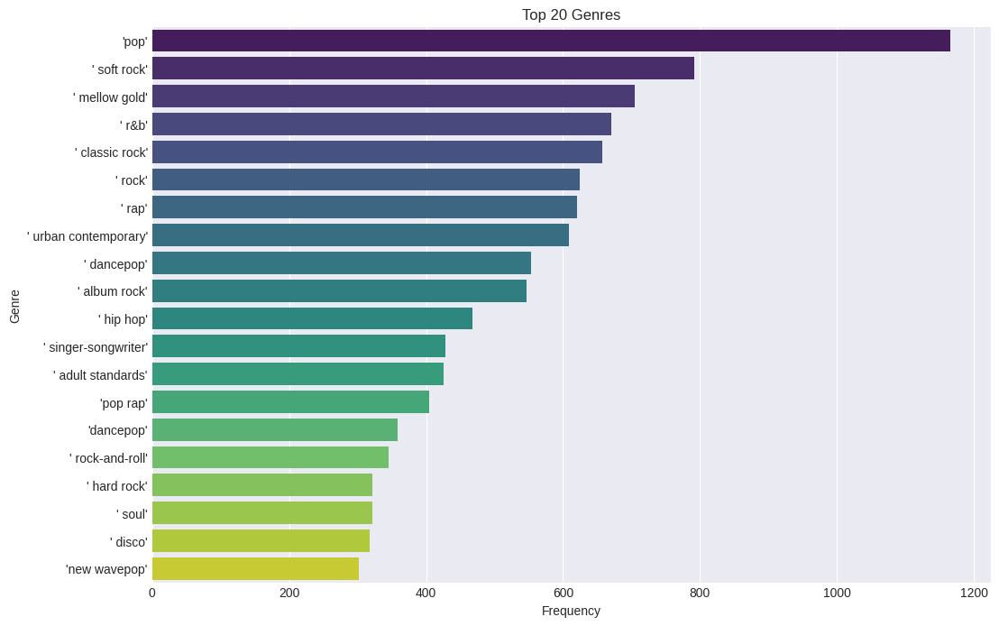

In [ ]:
#place ' pop' with 'pop'
genre_counts = {}
for genres_set in data['Artist(s) Genres']:
    genres_list = [genre.strip().lower() for genre in genres_set[1:-1].split(',')]
    genres_list = [genre.replace(" pop", "pop") for genre in genres_list]
    for genre in genres_list:
        if genre in genre_counts:
            genre_counts[genre] += 1
        else:
            genre_counts[genre] = 1

sorted_genre_counts = dict(sorted(genre_counts.items(), key=lambda item: item[1], reverse=True))

top_genres = list(sorted_genre_counts.keys())[:20]
genre_counts_top = {genre: sorted_genre_counts[genre] for genre in top_genres}

plt.figure(figsize=(12, 8))
sns.barplot(x=list(genre_counts_top.values()), y=list(genre_counts_top.keys()), palette="viridis")
plt.xlabel('Frequency')
plt.ylabel('Genre')
plt.title('Top 20 Genres')
plt.show()


#### **Correlation**

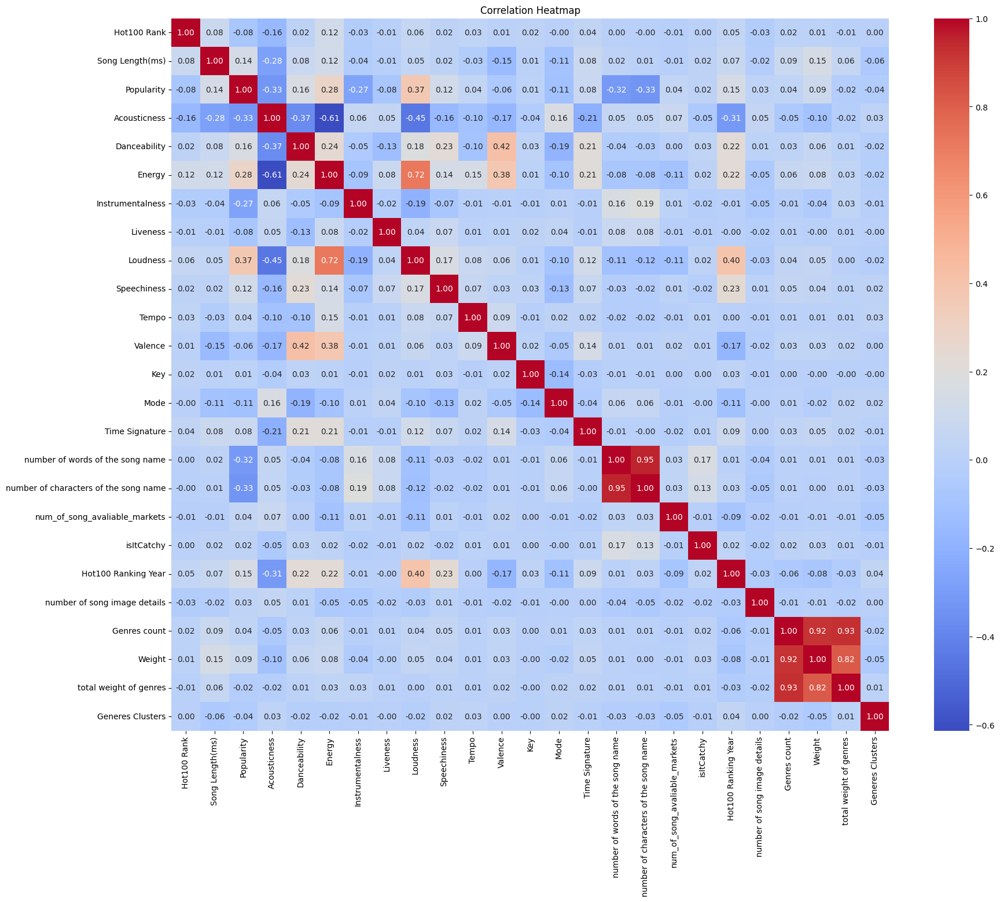

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
numeric_columns = df.select_dtypes(include='number')
correlation_matrix = numeric_columns.corr()
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

#### **How Tempo is related to song length**

In [ ]:
song_length_counts = df['Duration Category'].value_counts().reset_index()
song_length_counts.columns = ['Duration Category', 'Count']

# Calculate average tempo for each song length category
avg_temp = df.groupby('Duration Category')['Tempo'].mean().reset_index()

# Merge counts and average tempo
song_length_data = song_length_counts.merge(avg_temp, on='Duration Category')

fig = px.pie(song_length_data, names='Duration Category', values='Count', hole=0.5,
             labels={'Duration Category': 'Duration Category', 'Count': 'Count'},
             title='Song Length Distribution by Average Temp')
fig.update_traces(hovertemplate='<b>%{label}</b><br>Count: %{value}<br>Avg Temp: %{text}°C',
                  text=song_length_data['Tempo'].round(1))

fig.show()

It seems that most of songs is in average length category, not too long and not too short

#### **Key Feature**

In [ ]:
key_counts = df['Key'].value_counts().reset_index()
key_counts.columns = ['Key', 'Count']

# Specify the color you want for each key
color_discrete_map = {
    'C': 'blue',
    'C#': 'green',
    'D': 'red',
    'D#': 'orange',
    'E': 'purple',
    'F': 'cyan',
    'F#': 'magenta',
    'G': 'yellow',
    'G#': 'lime',
    'A': 'pink',
    'A#': 'brown',
    'B': 'grey'
}

fig = px.bar(key_counts, x='Key', y='Count',
             color='Key', color_discrete_map=color_discrete_map,
             labels={'Key': 'Key', 'Count': 'Count'},
             title='Distribution of Songs by Key')
fig.show()


### **Can we figure out Popularity based on Mode ?**

<ipython-input-32-0cf42cd07715>:6: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-32-0cf42cd07715>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




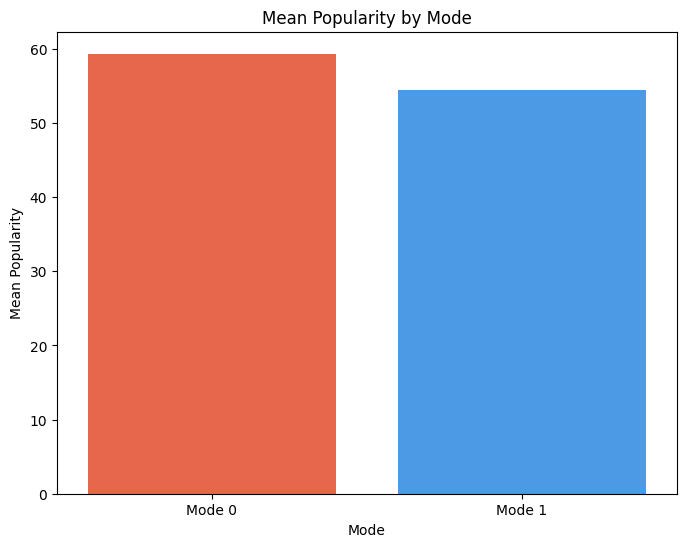

In [ ]:
plt.figure(figsize=(8, 6))
sns.barplot(x='Mode', y='Popularity', data=df, ci=None, palette=['#FF5733', '#3399FF'])
plt.title('Mean Popularity by Mode')
plt.xlabel('Mode')
plt.ylabel('Mean Popularity')
plt.xticks(ticks=[0, 1], labels=['Mode 0', 'Mode 1'])
plt.show()


The difference is not too large

### **Duration Category vs Time Signature**

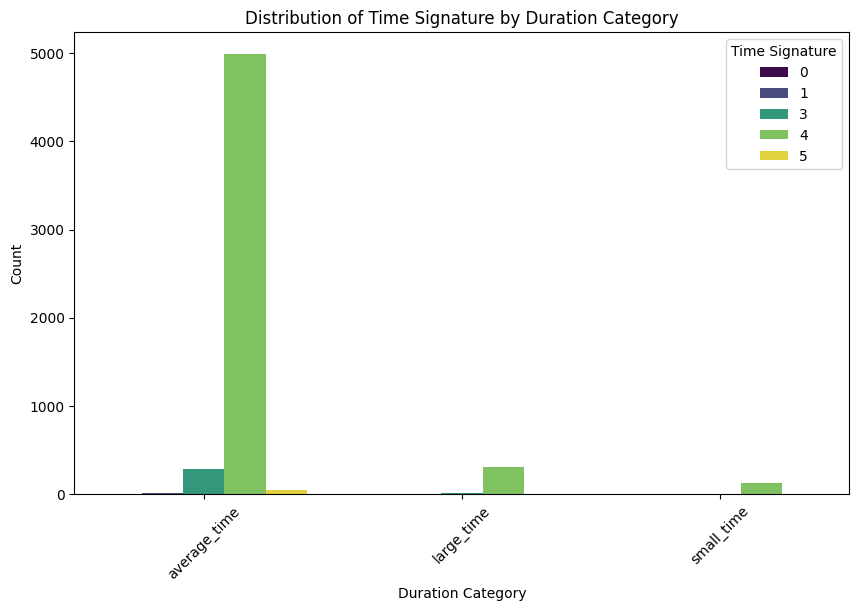

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Duration Category', hue='Time Signature', data=df, palette='viridis')
plt.title('Distribution of Time Signature by Duration Category')
plt.xlabel('Duration Category')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.show()


#### **Genre Count**

<ipython-input-35-0f9cd12914eb>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




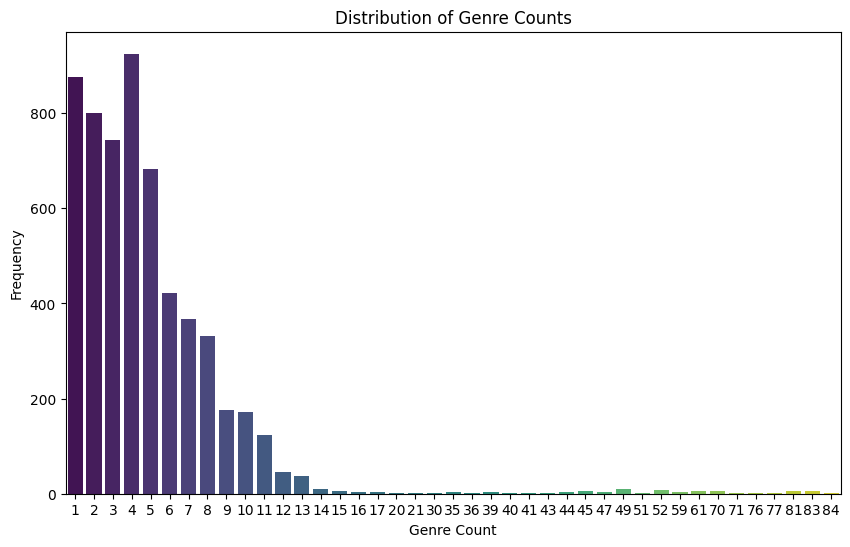

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Genres count', data=df, palette='viridis')
plt.title('Distribution of Genre Counts')
plt.xlabel('Genre Count')
plt.ylabel('Frequency')
plt.show()

Genres count for each artist, mostly each artists sings with avg 5 genres, and after 5 the count decrements which obiviously make sense

### **How features varies along different albums**

In [ ]:
import plotly.graph_objects as go

# Create dropdown options for albums
dropdown_options = []
for album in melted_df['Album'].unique():
    dropdown_options.append({'label': album, 'method': 'update', 'args': [{'x': [melted_df[melted_df['Album'] == album]['Feature']],
                                                                           'y': [melted_df[melted_df['Album'] == album]['Value']],
                                                                           'name': album}]})

# Create initial plot
fig = go.Figure()

for album in melted_df['Album'].unique():
    fig.add_trace(go.Scatter(x=melted_df[melted_df['Album'] == album]['Feature'],
                             y=melted_df[melted_df['Album'] == album]['Value'],
                             mode='lines',
                             name=album))

# Add dropdown menu for albums
fig.update_layout(updatemenus=[{'buttons': dropdown_options,
                                'direction': 'down',
                                'showactive': True,
                                'x': 0.1,
                                'xanchor': 'left',
                                'y': 1.15,
                                'yanchor': 'top'}])

fig.update_layout(title='Features Across Different Albums',
                  xaxis_title='Feature',
                  yaxis_title='Value')

fig.show()


#### **Distribution of songs in different markets**

In [ ]:
# Get the most frequent songs
most_frequent_songs = df['Song'].value_counts().head(10)
print("Top 10 Most Frequent Songs:")
print(most_frequent_songs)

Top 10 Most Frequent Songs:
Song
Heaven              5
To Each His Own     5
I Like It           5
Stay                4
Because Of You      4
Someday             4
Runaway             4
Missing You         4
You Belong To Me    4
Photograph          4
Name: count, dtype: int64


In [ ]:
# Get the top 10 most frequent songs
top_songs = df['Song'].value_counts().head(10).index

# Filter the DataFrame to include only the rows corresponding to the top songs
top_songs_df = df[df['Song'].isin(top_songs)]

fig = px.bar(top_songs_df, x='Song', y='num_of_song_avaliable_markets',
             title='Number of Available Markets for Top 10 Most Frequent Songs',
             labels={'Song': 'Song', 'num_of_song_avaliable_markets': 'Number of Available Markets'})

fig.update_layout(xaxis={'categoryorder': 'total descending'})  # Sort x-axis by frequency
fig.show()


### **Overview of Some song features with different combination of Genres and different combination of features**

In [ ]:
fig = px.scatter(df, x='Loudness', y='Artist(s) Genres', title='Loudness vs Genre')
fig.show()


In [ ]:
fig = px.scatter(df, x='Popularity', y='Artist(s) Genres', title='Popularity vs Genre')
fig.show()


In [ ]:
fig = px.scatter(df, x='Danceability', y='Valence', title='Valence vs Danceability',
                 marginal_x='histogram', marginal_y='histogram')
fig.show()


In [ ]:
fig = px.scatter(df, x='Speechiness', y='Danceability', title='Speechiness vs Danceability')
fig.show()


In [ ]:
fig1 = px.scatter(df, x='Energy', y='Valence', title='Valence vs Energy',
                 labels={'Energy': 'Energy', 'Valence': 'Valence'})
fig1.show()

In [ ]:
fig2 = px.scatter(df, x='Speechiness', y='Valence', title='Valence vs Speechiness',
                 labels={'Speechiness': 'Speechiness', 'Valence': 'Valence'})
fig2.show()


Not all features are correlated to each other, and even if correlated it's not a high correlation which results in an unmatched patterns as we see in plot which also make sense

#### **Exploring Average Tempo for each Key**

In [ ]:
fig = px.box(df, x='Key', y='Tempo', title='Average Tempo Distribution by Key', color_discrete_sequence=['brown'])
fig.update_layout(xaxis_title='Key', yaxis_title='Tempo')
fig.show()

#### **Observing top 10 songs and Non-Top 10 songs according to Hot100 Rank**

In [ ]:
df_sorted = df.sort_values(by='Hot100 Rank')
top_10 = df_sorted.head(10)
least_10 = df_sorted.tail(10)

combined_df = pd.concat([top_10, least_10])

fig = px.bar(combined_df, x='Song', y='Hot100 Rank', title='Top 10 vs Least 10 Songs by Hot100 Rank',
             color='Song', color_discrete_map={'top_10': 'blue', 'least_10': 'red'})
fig.update_layout(xaxis_title='Song', yaxis_title='Hot100 Rank')
fig.show()


#### **Observing how many albums are released accros decades and how they varies in different decades**

In [ ]:
# Group the data by 'decades' column and count the unique albums
albums_per_decade = df.groupby('Decade')['Album'].nunique().reset_index()

print(albums_per_decade)

           Decade  Album
0        Eighties    520
1         Fifties     97
2        Fourties      6
3       Nighnties    684
4             Old      1
5       Seventies    555
6         Sixties    438
7        Thirties      3
8  new millennium   1936


In [ ]:
albums_per_decade = df.groupby('Decade')['Album'].nunique().reset_index()

fig = px.bar(albums_per_decade, x='Decade', y='Album', title='Number of Albums Released Across Decades')
fig.update_layout(xaxis_title='Decades', yaxis_title='Number of Albums')
fig.show()


In [ ]:
df.dropna(inplace=True)

# **Visualizations**

## **Statistical Overview**

In [68]:
data.columns

Index(['Song', 'Album', 'Artist Names', 'Hot100 Rank', 'Song Length(ms)',
       'Spotify Link', 'Song Image', 'Spotify URI', 'Popularity',
       'Acousticness', 'Danceability', 'Energy', 'Instrumentalness',
       'Liveness', 'Loudness', 'Speechiness', 'Tempo', 'Valence', 'Key',
       'Mode', 'Time Signature', 'number of words of the song name',
       'number of characters of the song name', 'is_local',
       'num_of_song_avaliable_markets', 'Duration Category', 'has_Potential',
       'is_colorful', 'color_values', 'image_description', 'fromTop1000Artist',
       'isItCatchy', 'Album Release Date', 'Hot100 Ranking Year', 'Decade',
       'Season', 'number of song image details', 'Artist(s) Genres',
       'Genres count', 'Weight', 'total weight of genres', 'Album_isTop_1810',
       'Generes Clusters', 'Popularity_Category'],
      dtype='object')

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




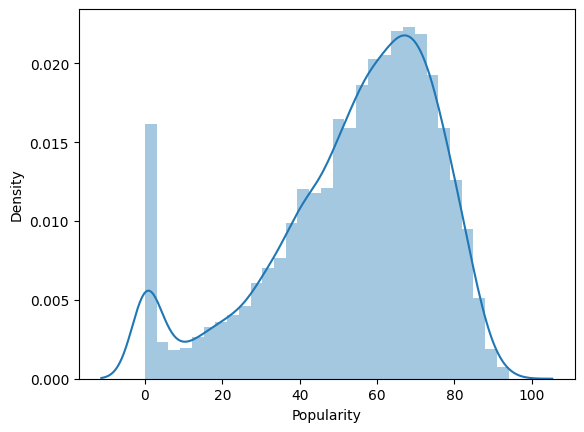

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




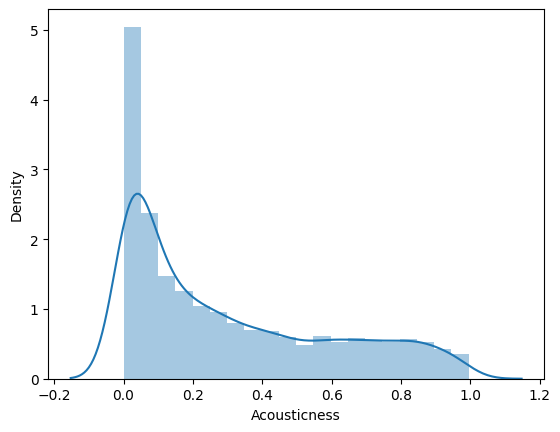

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




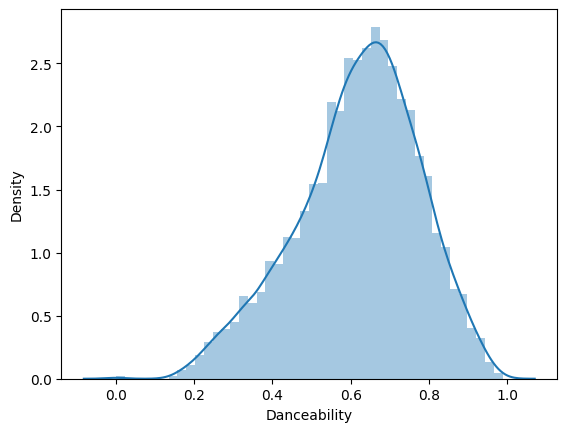

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




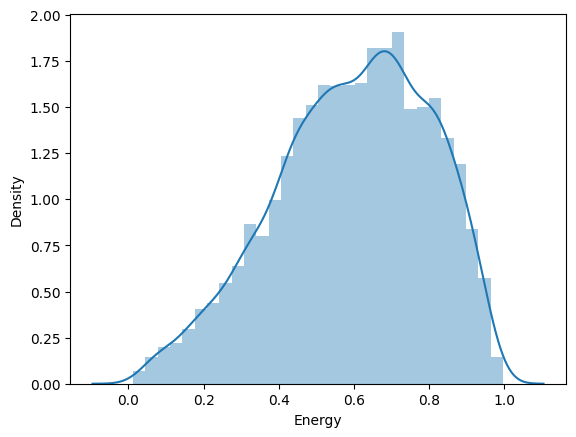

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




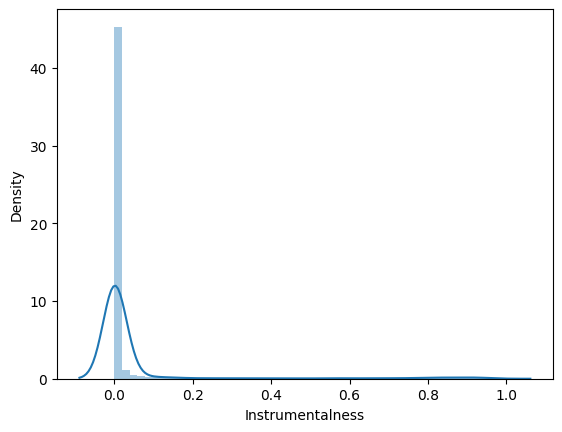

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




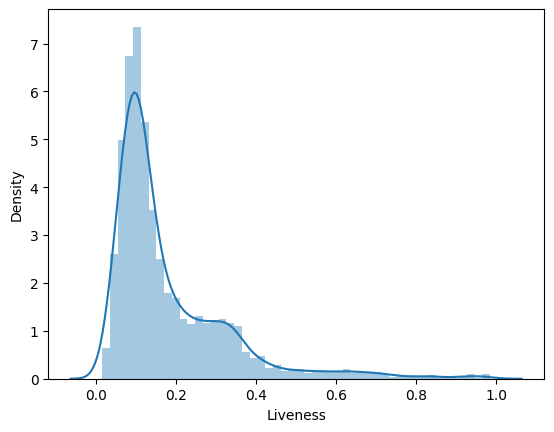

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




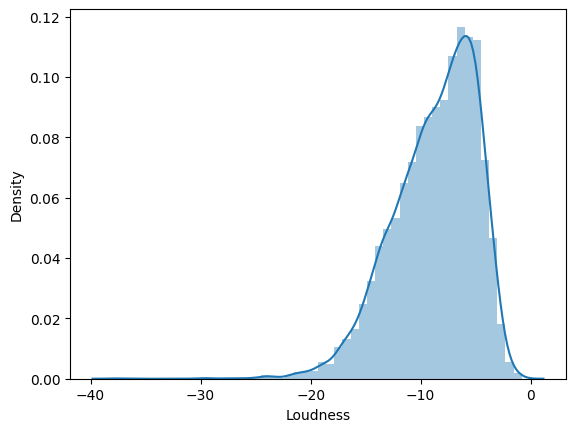

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




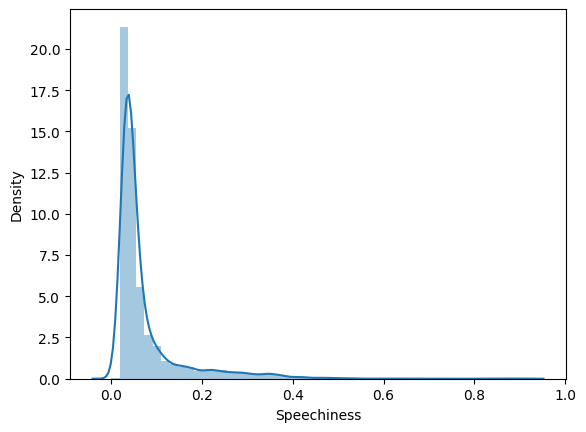

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




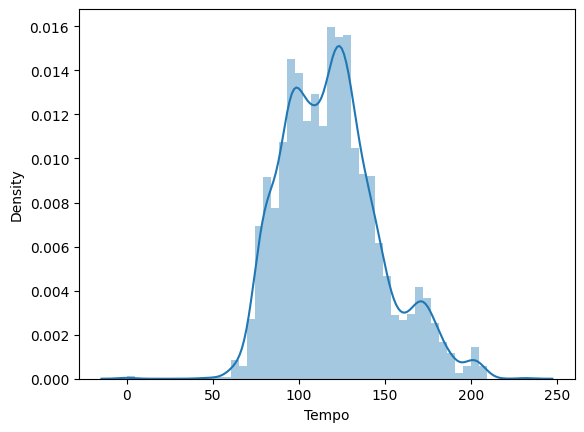

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




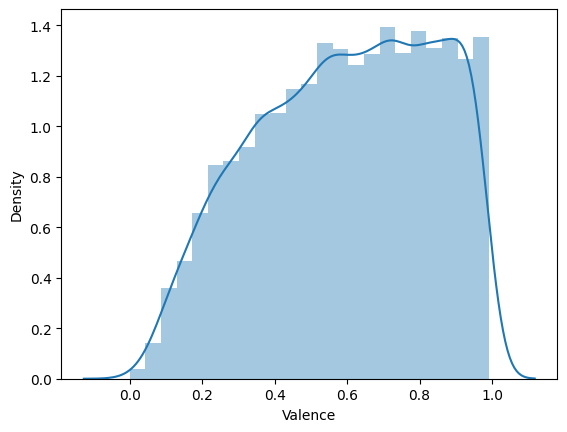

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




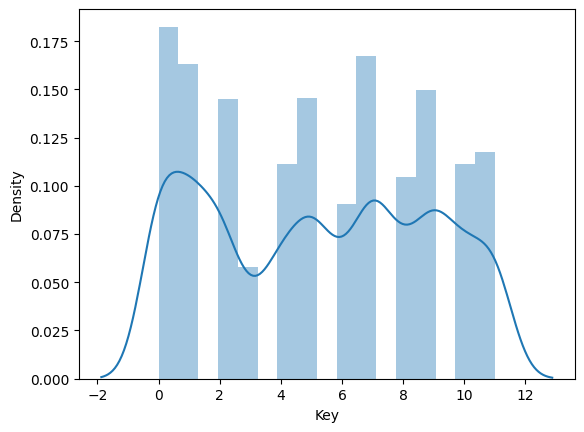

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




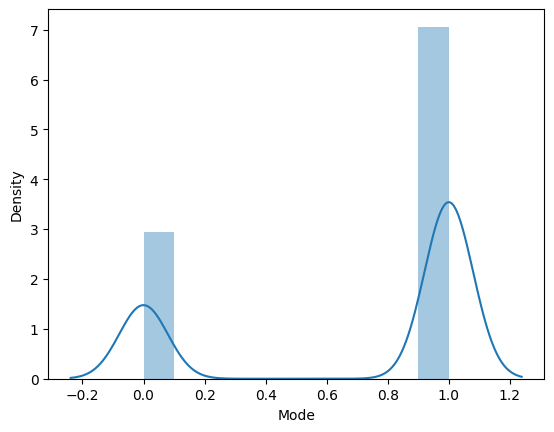

<ipython-input-69-9e6a3da2c9d4>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




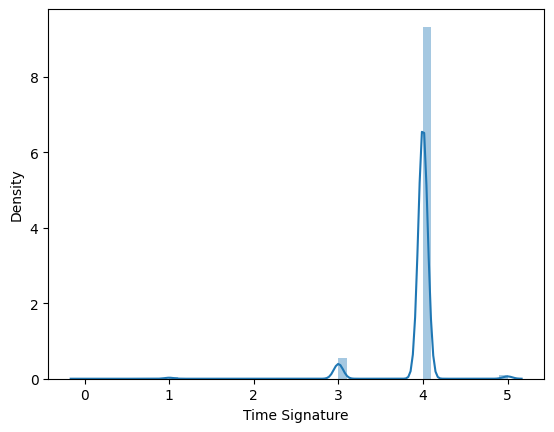

In [69]:
# Let's check distribution of those columns
num_cols = ['Popularity',
       'Acousticness', 'Danceability', 'Energy', 'Instrumentalness',
       'Liveness', 'Loudness', 'Speechiness', 'Tempo', 'Valence', 'Key',
       'Mode', 'Time Signature']
for col in num_cols:
    sns.distplot(data[col], kde = True)
    plt.show()

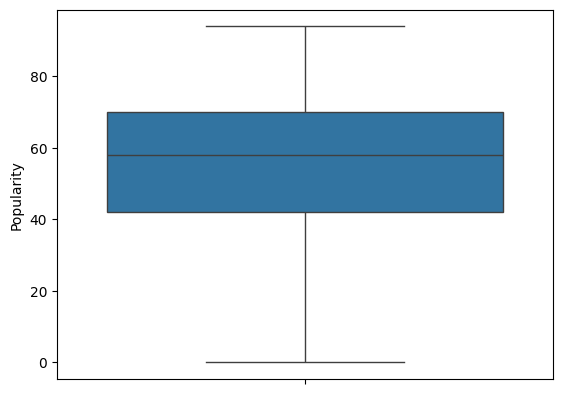

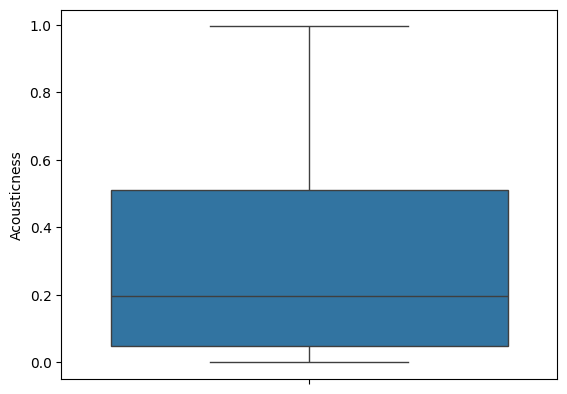

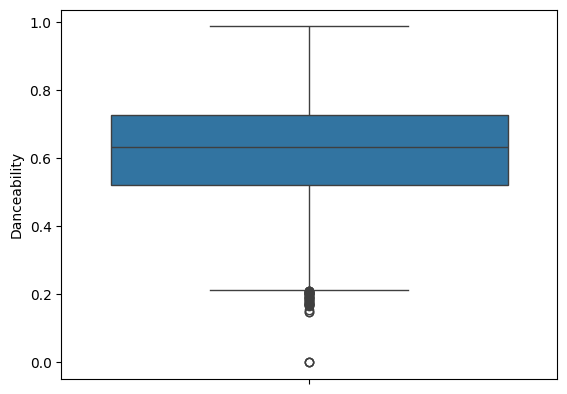

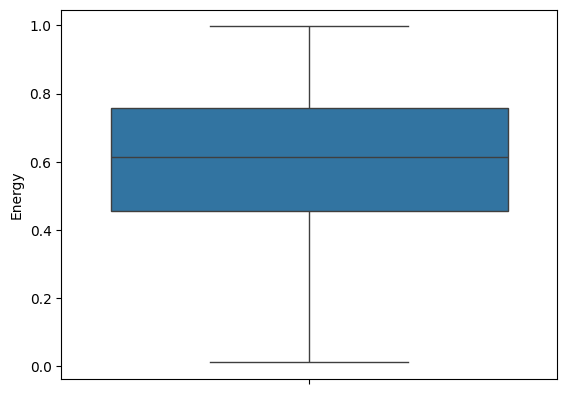

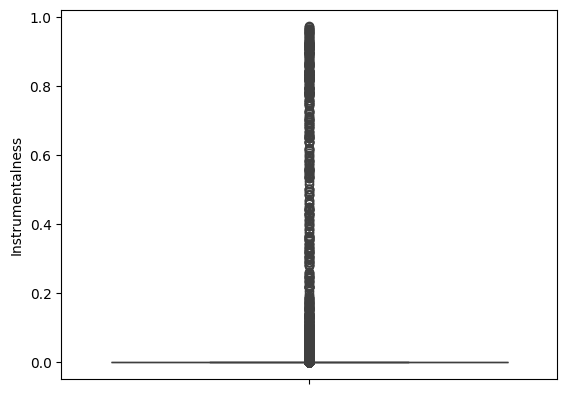

...

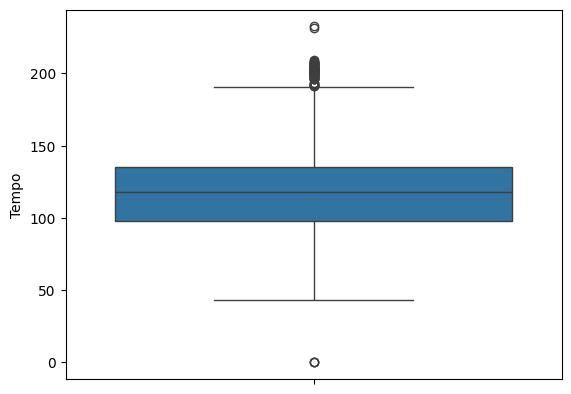

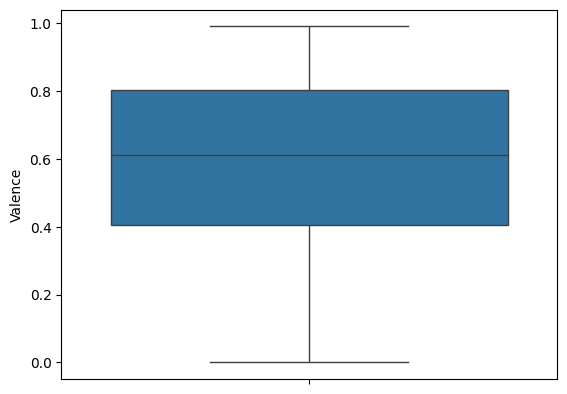

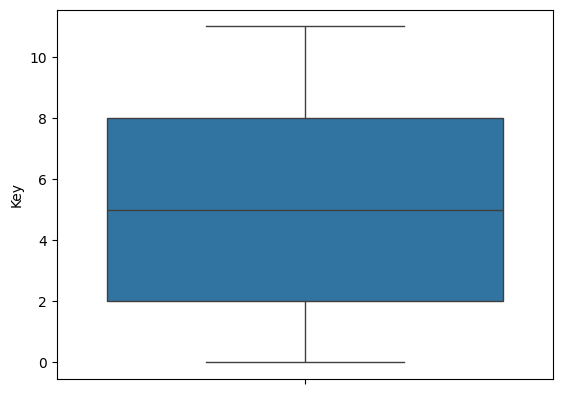

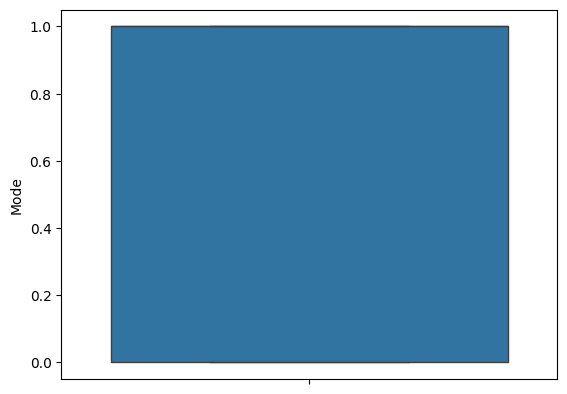

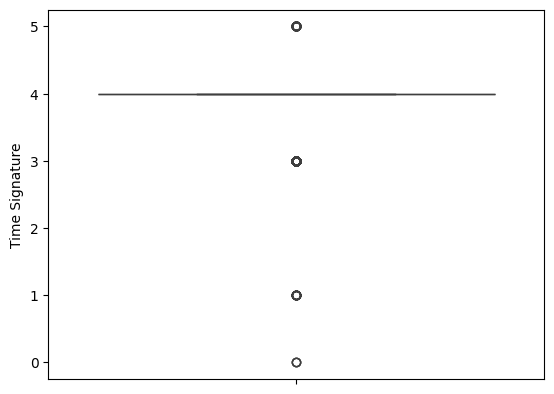

In [71]:
# Let's check Outliers of these columns
num_cols = ['Popularity',
       'Acousticness', 'Danceability', 'Energy', 'Instrumentalness',
       'Liveness', 'Loudness', 'Speechiness', 'Tempo', 'Valence', 'Key',
       'Mode', 'Time Signature']
for col in num_cols:
    sns.boxplot(data[col])
    plt.show()

Outliers Varies differently in different columns

## **Overview of Some song features with different combination of Genres and different combination of features**

#### Numerical Features vs Popularity
Take in notice that you must select a category

In [21]:
# Create subplots
fig = go.Figure()

# Plotting each feature against popularity
for feature in ['Acousticness', 'Danceability', 'Instrumentalness', 'Energy', 'Liveness', 'Time Signature','Song Length(ms)']:
    fig.add_trace(go.Scatter(x=data[feature], y=data['Popularity'], mode='markers', name=f'{feature} vs. Popularity'))

# Update layout
fig.update_layout(
    title='Features vs. Popularity',
    xaxis=dict(title='Feature'),
    yaxis=dict(title='Popularity')
)

# Show the plot
fig.show()


#### Key Feature

In [45]:
key_counts = data['Key'].value_counts().reset_index()
key_counts.columns = ['Key', 'Count']

# Specify the color you want for each key
color_discrete_map = {
    'C': 'blue',
    'C#': 'green',
    'D': 'red',
    'D#': 'orange',
    'E': 'purple',
    'F': 'cyan',
    'F#': 'magenta',
    'G': 'yellow',
    'G#': 'lime',
    'A': 'pink',
    'A#': 'brown',
    'B': 'grey'
}

fig = px.bar(key_counts, x='Key', y='Count',
             color='Key', color_discrete_map=color_discrete_map,
             labels={'Key': 'Key', 'Count': 'Count'},
             title='Distribution of Songs by Key')
fig.show()


#### Genre Count

<ipython-input-50-072e6fe7881a>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




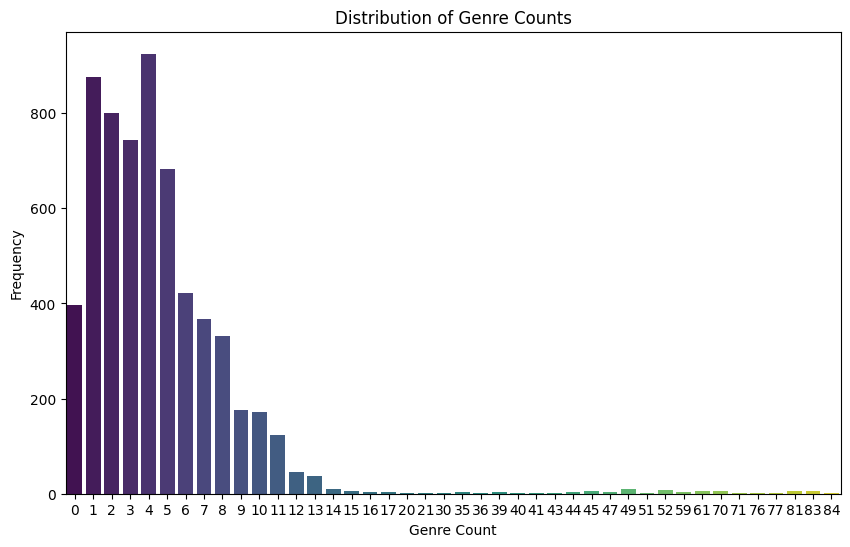

In [50]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Genres count', data=data, palette='viridis')
plt.title('Distribution of Genre Counts')
plt.xlabel('Genre Count')
plt.ylabel('Frequency')
plt.show()

#### Loudness vs Genre

In [59]:
fig = px.scatter(data, x='Loudness', y='Artist(s) Genres', title='Loudness vs Genre')
fig.show()


#### Popularity vs Genre

In [60]:
fig = px.scatter(data, x='Popularity', y='Artist(s) Genres', title='Popularity vs Genre')
fig.show()


#### Acousticness vs Instrumentalness

In [22]:
fig = px.scatter(data, x='Acousticness', y='Instrumentalness', marginal_x='histogram', marginal_y='histogram',
                 title='Joint Plot: Acousticness vs Instrumentalness', color='Acousticness',
                 labels={'Acousticness': 'Acousticness', 'Instrumentalness': 'Instrumentalness'})

# Show the plot
fig.show()


#### Energy vs Danceability

In [23]:
fig = px.scatter(data, x='Danceability', y='Energy', title='Danceability vs Energy', labels={'Danceability': 'Danceability', 'Energy': 'Energy'},width=800,height=500)
fig.show()


#### Danceability vs Acousticness

In [24]:
fig = px.scatter(data, x='Danceability', y='Acousticness',
                 title='Danceability vs Acousticness',
                 labels={'Danceability': 'Danceability', 'Acousticness': 'Acousticness'},
                 width=800,
                 height=500)

# Show the plot
fig.show()


#### Valence vs Danceability

In [61]:
fig = px.scatter(data, x='Danceability', y='Valence', title='Valence vs Danceability',
                 marginal_x='histogram', marginal_y='histogram')
fig.show()


#### Speechiness vs Danceability

In [62]:
fig = px.scatter(data, x='Speechiness', y='Danceability', title='Speechiness vs Danceability')
fig.show()


#### Energy vs Instrumentalness

In [25]:
fig = px.scatter(data, x='Instrumentalness', y='Energy',
                 title='Instrumentalness vs Energy',
                 labels={'Instrumentalness': 'Instrumentalness', 'Energy': 'Energy'},
                 width=800,
                 height=500)

# Show the plot
fig.show()


Not all features are correlated to each other, and even if correlated it's not a high correlation which results in an unmatched patterns as we see in plot which also make sense

#### Duration Category vs Time Signature

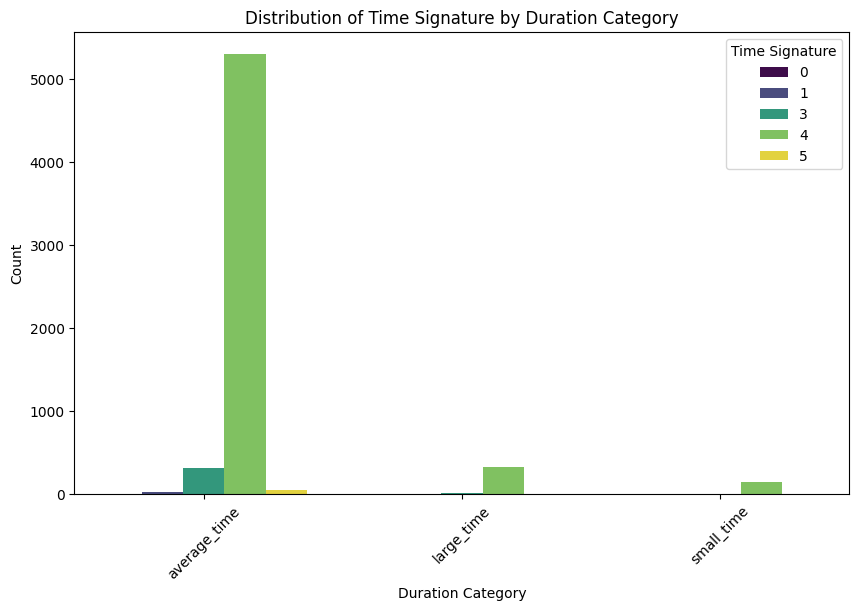

In [48]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Duration Category', hue='Time Signature', data=data, palette='viridis')
plt.title('Distribution of Time Signature by Duration Category')
plt.xlabel('Duration Category')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.show()

#### Song Length Distirbution by average Tempo

In [43]:
song_length_counts = data['Duration Category'].value_counts().reset_index()
song_length_counts.columns = ['Duration Category', 'Count']

# Calculate average tempo for each song length category
avg_temp = data.groupby('Duration Category')['Tempo'].mean().reset_index()

# Merge counts and average tempo
song_length_data = song_length_counts.merge(avg_temp, on='Duration Category')

fig = px.pie(song_length_data, names='Duration Category', values='Count', hole=0.5,
             labels={'Duration Category': 'Duration Category', 'Count': 'Count'},
             title='Song Length Distribution by Average Temp')
fig.update_traces(hovertemplate='<b>%{label}</b><br>Count: %{value}<br>Avg Temp: %{text}°C',
                  text=song_length_data['Tempo'].round(1))

fig.show()

#### Average Tempo for each Key

In [64]:
fig = px.box(data, x='Key', y='Tempo', title='Average Tempo Distribution by Key', color_discrete_sequence=['brown'])
fig.update_layout(xaxis_title='Key', yaxis_title='Tempo')
fig.show()

#### Can we figure out Popularity based on Mode ?

<ipython-input-46-2c234dfd2b22>:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-46-2c234dfd2b22>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




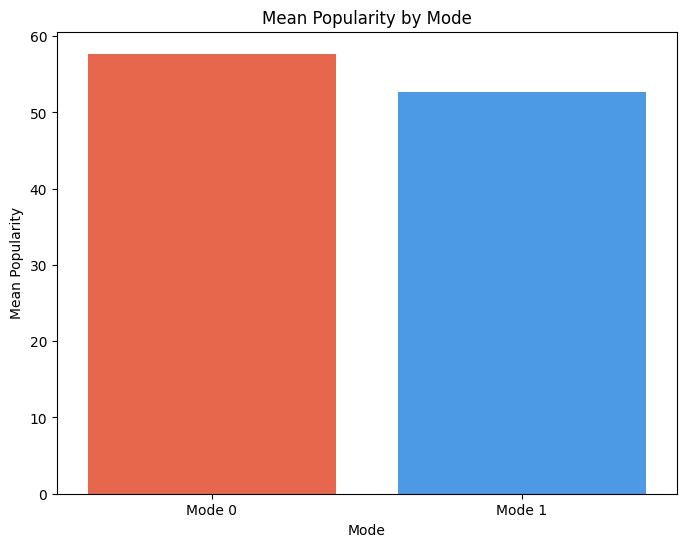

In [46]:
plt.figure(figsize=(8, 6))
sns.barplot(x='Mode', y='Popularity', data=data, ci=None, palette=['#FF5733', '#3399FF'])
plt.title('Mean Popularity by Mode')
plt.xlabel('Mode')
plt.ylabel('Mean Popularity')
plt.xticks(ticks=[0, 1], labels=['Mode 0', 'Mode 1'])
plt.show()

#### Top Songs Average Length

In [27]:
# Sort DataFrame by 'Popularity' column in descending order to get top 10 songs
top_10_songs = data.nlargest(10, 'Popularity')

# Calculate the average song length for each of the top 10 songs
avg_song_lengths = top_10_songs.groupby('Song')['Song Length(ms)'].mean().reset_index()

# Create an interactive bar plot using Plotly
fig = px.bar(avg_song_lengths, x='Song', y='Song Length(ms)',
             title='Average Song Length of Top 10 Songs',
             labels={'Song Length(ms)': 'Average Song Length (ms)', 'Song': 'Song'},
             color='Song',
             width=800,
             height=500)

# Show the plot
fig.show()

#### Distribution of songs in different markets

In [57]:
# Get the most frequent songs
most_frequent_songs = data['Song'].value_counts().head(10)
print("Top 10 Most Frequent Songs:")
print(most_frequent_songs)

Top 10 Most Frequent Songs:
Song
Heaven                  6
I Like It               6
To Each His Own         5
Someday                 4
Because Of You          4
I Wish                  4
Angel                   4
Runaway                 4
Missing You             4
Just the Way You Are    4
Name: count, dtype: int64


In [58]:
# Get the top 10 most frequent songs
top_songs = data['Song'].value_counts().head(10).index

# Filter the DataFrame to include only the rows corresponding to the top songs
top_songs_df = data[data['Song'].isin(top_songs)]

fig = px.bar(top_songs_df, x='Song', y='num_of_song_avaliable_markets',
             title='Number of Available Markets for Top 10 Most Frequent Songs',
             labels={'Song': 'Song', 'num_of_song_avaliable_markets': 'Number of Available Markets'})

fig.update_layout(xaxis={'categoryorder': 'total descending'})  # Sort x-axis by frequency
fig.show()


#### Top popular song relative to SongLength and Popularity

In [28]:
# Define a threshold for popularity (e.g., top 25%)
popularity_threshold = data['Popularity'].quantile(0.75)

# Categorize popularity based on the threshold
data['Popularity_Category'] = pd.cut(data['Popularity'], bins=[0, popularity_threshold, data['Popularity'].max()], labels=['Low', 'High'])

# Create an interactive scatter plot
fig = px.scatter(data, x='Speechiness', y='Song Length(ms)', color='Popularity_Category',
                 title='Speechiness vs Song Length with Popularity Category',
                 labels={'Speechiness': 'Speechiness', 'Song Length': 'Song Length'},
                 width=800, height=500)

# Show the plot
fig.show()

#### Number of Songs released at each season

In [29]:
season_counts = data['Season'].value_counts().reset_index()
season_counts.columns = ['Season', 'Total Songs']

# Create an interactive pie chart
fig = px.pie(season_counts, values='Total Songs', names='Season',
             title='Distribution of Songs Released in Each Season')

# Show the plot
fig.show()


#### Observing top 10 songs and Non-Top 10 songs according to Hot100 Rank

In [65]:
df_sorted = data.sort_values(by='Hot100 Rank')
top_10 = df_sorted.head(10)
least_10 = df_sorted.tail(10)

combined_df = pd.concat([top_10, least_10])

fig = px.bar(combined_df, x='Song', y='Hot100 Rank', title='Top 10 vs Least 10 Songs by Hot100 Rank',
             color='Song', color_discrete_map={'top_10': 'blue', 'least_10': 'red'})
fig.update_layout(xaxis_title='Song', yaxis_title='Hot100 Rank')
fig.show()


### Top 10 songs and the Seasons they were released in

In [26]:
# Sort DataFrame based on 'Popularity'
sorted_df = data.nlargest(10, 'Popularity')

# Create a bar plot
fig = px.bar(sorted_df, x='Song', y='Popularity', color='Season', title='Top 10 Songs and Their Seasons')
fig.update_layout(xaxis_title='Song', yaxis_title='Popularity')

# Show the plot
fig.show()

### Distrubution with of Popularity relative to the cover image of Song

In [30]:
fig = px.box(data, x='isItCatchy', y='Popularity', title='Distribution of Popularity by Catchy Category')

# Set labels for axes
fig.update_xaxes(title_text='Catchy')
fig.update_yaxes(title_text='Popularity')

# Show the plot
fig.show()


## **Artists and Albums Features**

#### How features varies along different albums

In [ ]:
import plotly.graph_objects as go

# Features to include
features = ['Popularity', 'Acousticness', 'Danceability', 'Energy', 'Instrumentalness', 'Liveness', 'Loudness', 'Speechiness', 'Tempo', 'Valence', 'Key', 'Mode', 'Time Signature']

# Create dropdown options for albums
dropdown_options = []
for album in data['Album'].unique():
    for feature in features:
        dropdown_options.append({'label': album + ' - ' + feature, 'method': 'update', 'args': [{'x': [data[data['Album'] == album][feature]],
                                                                                                   'y': [data[data['Album'] == album][feature]],
                                                                                                   'name': album + ' - ' + feature}]})

# Create initial plot
fig = go.Figure()

# Add traces for each album-feature combination
for album in data['Album'].unique():
    for feature in features:
        fig.add_trace(go.Scatter(x=data[data['Album'] == album][feature],
                                 y=data[data['Album'] == album][feature],
                                 mode='lines',
                                 name=album + ' - ' + feature))

# Add dropdown menu for albums
fig.update_layout(updatemenus=[{'buttons': dropdown_options,
                                'direction': 'down',
                                'showactive': True,
                                'x': 0.1,
                                'xanchor': 'left',
                                'y': 1.15,
                                'yanchor': 'top'}])

# Update layout
fig.update_layout(title='Features Across Different Albums',
                  xaxis_title='Feature',
                  yaxis_title='Value')

# Show plot
fig.show()


#### Top 30 artists in our data based on the "fromTop1000Artist" column

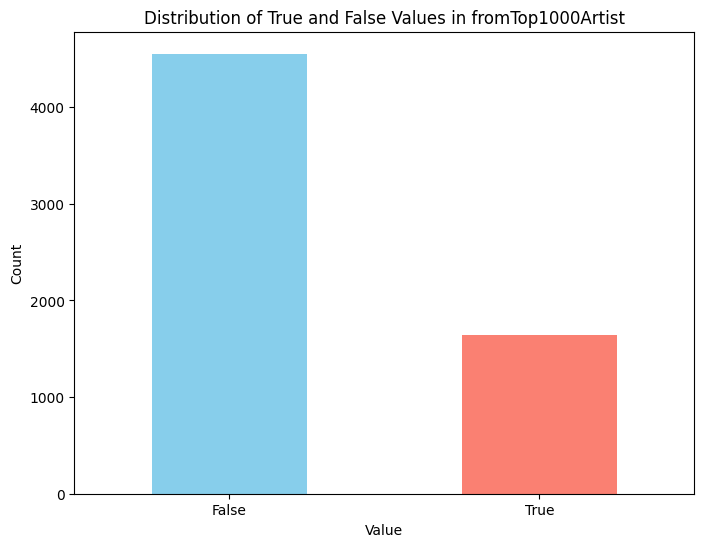

In [31]:
# Plot the distribution of True and False values in the "fromTop1000Artist" column
plt.figure(figsize=(8, 6))
data['fromTop1000Artist'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Distribution of True and False Values in fromTop1000Artist')
plt.xlabel('Value')
plt.ylabel('Count')
# Set ticks and labels
plt.xticks(ticks=[0, 1], labels=['False', 'True'], rotation=0)
plt.show()

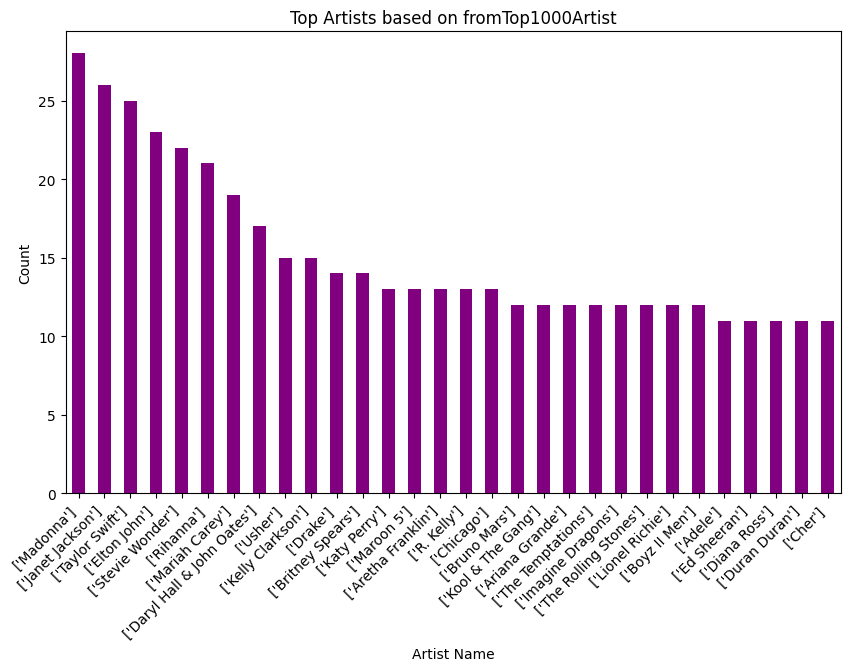

In [32]:
top_artists = data[data['fromTop1000Artist']]['Artist Names'].value_counts().head(30)

plt.figure(figsize=(10, 6))
top_artists.plot(kind='bar', color='purple')
plt.title('Top Artists based on fromTop1000Artist')
plt.xlabel('Artist Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

In [33]:
top_artists = data[data['fromTop1000Artist']]['Artist Names'].value_counts().head(30)

# Convert to DataFrame
top_artists_df = top_artists.reset_index()
top_artists_df.columns = ['Artist Name', 'Count']

# Plot the top artists using Plotly
fig = px.bar(top_artists_df, x='Artist Name', y='Count', color='Count',
             labels={'Count': ''},
             title='Top Artists based on fromTop1000Artist',
             template='plotly',
             height=500)
fig.update_layout(xaxis_tickangle=-45, yaxis=dict(ticks='', showticklabels=False))
fig.show()

#### Top artists for each decade

In [34]:
top_artists_by_decade = data.groupby(['Decade', 'Artist Names']).size().reset_index(name='Count')
top_artists_by_decade = top_artists_by_decade.groupby('Decade').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

traces = []
for decade, artists in top_artists_by_decade.groupby('Decade'):
    trace = go.Bar(
        x=artists['Artist Names'],
        y=artists['Count'],
        name=decade,
        marker=dict(color=artists['Count'], colorscale='Viridis', line=dict(color='rgb(0,0,0)', width=1.5)),
        hovertemplate='<b>%{x}</b><br>Count: %{y}<extra></extra>'
    )
    traces.append(trace)

# Create dropdown menu
buttons = []
for decade in top_artists_by_decade['Decade'].unique():
    visible = [False] * len(top_artists_by_decade['Decade'].unique())
    visible[list(top_artists_by_decade['Decade'].unique()).index(decade)] = True
    button = dict(label=decade,
                  method='update',
                  args=[{'visible': visible},
                        {'title': f'Top Artists in {decade}'}])
    buttons.append(button)

layout = dict(title='Top Artists by Decade',
              xaxis=dict(title='Artist Names'),
              yaxis=dict(title='Count'),
              updatemenus=[dict(buttons=buttons,
                                direction='down',
                                pad={'r': 10, 't': 10},
                                showactive=True,
                                x=0.1,
                                xanchor='left',
                                y=1.1,
                                yanchor='top')])

fig = go.Figure(data=traces, layout=layout)
fig.show()


In [35]:
top_artists_by_decade = data.groupby(['Decade', 'Artist Names']).size().reset_index(name='Count')
top_artists_by_decade = top_artists_by_decade.groupby('Decade').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

traces = []
buttons = []
for i, (decade, artists) in enumerate(top_artists_by_decade.groupby('Decade')):
    colors = px.colors.qualitative.Plotly[:len(artists)]
    trace = go.Pie(
        labels=artists['Artist Names'],
        values=artists['Count'],
        hole=0.4,
        hoverinfo='label+percent',
        name=decade,
        marker=dict(colors=colors)
    )
    traces.append(trace)

    # Create button for dropdown menu
    visible = [False] * len(top_artists_by_decade)
    visible[i] = True
    button = dict(label=decade,
                  method='update',
                  args=[{'visible': visible},
                        {'title': f'Top Artists in {decade}'}])
    buttons.append(button)

# Create layout
layout = go.Layout(
    title='Top Artists by Decade',
    showlegend=True,
    annotations=[
        dict(
            text="Decades",
            x=0.5,
            y=-0.1,
            font=dict(size=20),
            showarrow=False
        )
    ],
    updatemenus=[
        dict(
            buttons=buttons,
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.1,
            yanchor="top"
        )
    ]
)

# Create figure
fig = go.Figure(data=traces, layout=layout)

# Show plot
fig.show()


#### Top Artists with most top albums

In [36]:
# Filter only the rows where Album_isTop_1810 is True
top_albums_df = data[data['Album_isTop_1810']]

# Group by artist and count the number of top albums
top_album_counts = top_albums_df.groupby('Artist Names').size().reset_index(name='TopAlbumCount')

# Sort the artists by the count of top albums and select the top 10
top_20_artists = top_album_counts.nlargest(20, 'TopAlbumCount')

# Plotting
fig = px.bar(top_20_artists, x='TopAlbumCount', y='Artist Names', orientation='h',
             labels={'TopAlbumCount': 'Number of Top Albums', 'Artist Names': 'Artist Names'},
             title='Top 20 Artists with Most Top Albums')
fig.show()

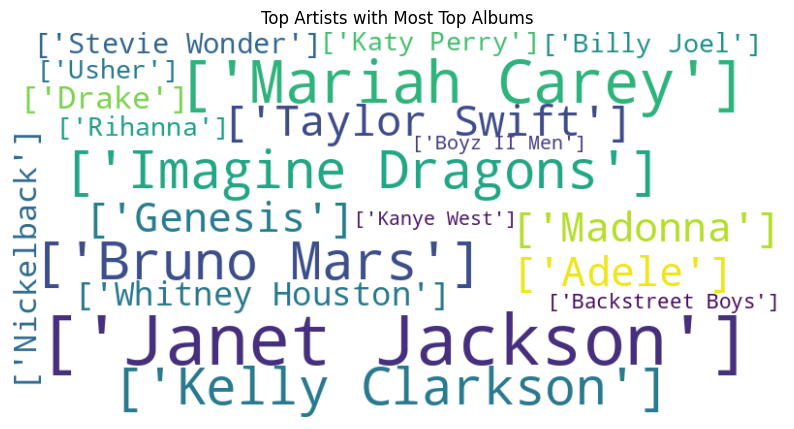

In [37]:
# Create a dictionary from the DataFrame
artist_counts_dict = dict(zip(top_20_artists['Artist Names'], top_20_artists['TopAlbumCount']))

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(artist_counts_dict)

# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top Artists with Most Top Albums')
plt.axis('off')
plt.show()


#### Distribution of Decades

In [ ]:
# Count the occurrences of each decade
decade_counts = data['Decade'].value_counts()

# Create a DataFrame for the pie chart
decade_counts_df = pd.DataFrame({'Decade': decade_counts.index, 'Count': decade_counts.values})

# Plot the distribution of decades using Plotly
fig = px.pie(decade_counts_df, values='Count', names='Decade',
             title='Distribution of Decades',
             hole=0.3,
             template='plotly_dark')
fig.show()

#### Observing how many albums are released accros decades and how they varies in different decades

In [66]:
# Group the data by 'decades' column and count the unique albums
albums_per_decade = data.groupby('Decade')['Album'].nunique().reset_index()

print(albums_per_decade)

           Decade  Album
0        Eighties    541
1         Fifties    103
2        Fourties      8
3       Nighnties    727
4             Old      2
5       Seventies    590
6         Sixties    469
7        Thirties      3
8  new millennium   2138


In [67]:
albums_per_decade = data.groupby('Decade')['Album'].nunique().reset_index()

fig = px.bar(albums_per_decade, x='Decade', y='Album', title='Number of Albums Released Across Decades')
fig.update_layout(xaxis_title='Decades', yaxis_title='Number of Albums')
fig.show()


#### Years that had the most Albums releases

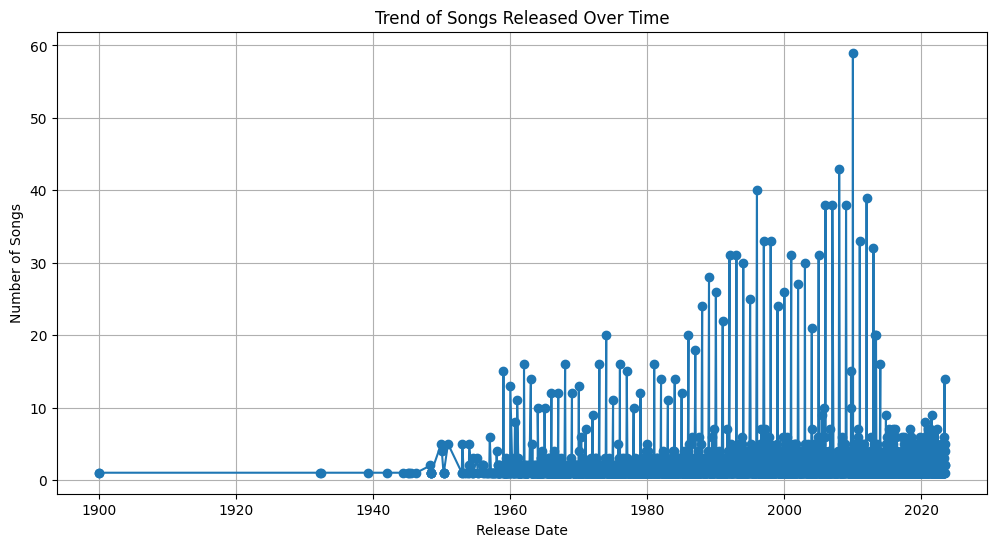

In [38]:
data['Album Release Date'] = pd.to_datetime(data['Album Release Date'])

# Group by release date and count the number of songs
release_date_counts = data.groupby('Album Release Date').size().reset_index(name='SongCount')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(release_date_counts['Album Release Date'], release_date_counts['SongCount'], marker='o', linestyle='-')
plt.title('Trend of Songs Released Over Time')
plt.xlabel('Release Date')
plt.ylabel('Number of Songs')
plt.grid(True)
plt.show()


In [39]:
# Assuming 'Album Release Date' column is in datetime format
data['Album Release Date'] = pd.to_datetime(data['Album Release Date'])

# Group by release date and count the number of songs
release_date_counts = data.groupby('Album Release Date').size().reset_index(name='SongCount')

# Create an interactive time series graph with Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=release_date_counts['Album Release Date'], y=release_date_counts['SongCount'],
                         mode='lines+markers', name='Number of Songs', line=dict(color='hotpink')))

# Customize layout
fig.update_layout(title='Trend of Songs Released Over Time',
                   xaxis_title='Release Date',
                   yaxis_title='Number of Songs',
                   hovermode='x unified')

fig.show()
